In [6]:
# import needed libraries

# import logging
# logging.basicConfig(level=logging.DEBUG)

# general
import os
BASE_DIR = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))

import pprint
pp = pprint.PrettyPrinter(indent=4)

from pathlib import Path
# import glob

import sys
import json
import csv
import datetime
from datetime import date

# computation
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression

# network and connections
import requests

# plotting
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

#### Some measuring stations have both manual and telemetry water level, and measured and calcualted discharge data.
#### The default would be manual stage and calculated discharge. However, if for that station, during any time, the telemetry stage and measured discharge is found, those would be used.
#### For both stage and discharge, daily average is used if multiple measurements are found.***

In [7]:
# stations with no discharge to calculate rating curves
# Kg. Chhnang, Kompong Luong, 
date_tail = 'T00:00:00.000Z'
stations = [
    {
        'name': 'Neak_Luong',
        'discharge_id': '661d84572a544af4b7f28d9dc685d4a8',
        'stage_id': '0c55bc1fb44e4caf881226bbf8a6e62a',
        'start_date': '1964-12-31',
        'end_date': '2002-12-30',
    },
    {
        'name': 'Stung_Treng',
         # [ calculated, measured ]
        'discharge_id': ['2066a06f57764afca57a6be0f3eff8a7', 'dcd4b92a9d9341859f5f1658836166f1'],
        # [ manual, telemetry ]
        'stage_id': ['000e84564d1b425ebcc2c2292ed14061', '0a723f8802e44a6bb12c08dcf1816a83'],
        'start_date': '1909-12-31',
        'end_date': '2021-05-16',
    },
    {
        'name': 'Chaktomuk',
        'discharge_id': '983ed55df7e04410b23fc6d72eb8f235',
        'stage_id': '7f84c4d851a543d1a5eccc53947e0d3c',
        'start_date': '1959-12-31',
        'end_date': '2002-12-30',
    },
    {
        'name': 'Kompong_Kdei',
        'discharge_id': '2d363b26ee524761b5d2da2a0ef59613',
        'stage_id': '75ba98758e7c4eb3b105f733db150307',
        'start_date': '1962-05-20',
        'end_date': '2002-12-28',
    },
    {
        'name': 'Prek_Kdam',
        'discharge_id': ['5579eb91df394552bac8c939724ba6cc', '6615982ab17b4a38a5269e5ba4ef8a4f'],
        'stage_id': ['81e259eb15f64135834fe9e388ee7fbb', '5a7037f272c745d5bcafcc16a5c2f89c'],
        'start_date': '1960-10-12',
        'end_date': '2018-12-17',
    },
    {
        'name': 'Kg._Thmar',
        'discharge_id': '2575ba232eb1406a8ce460de9fd5849a',
        'stage_id': '549c7f63d6dc4392b233b2049bd23d11',
        'start_date': '1962-03-31',
        'end_date': '2002-12-30',
    },
    {
        'name': 'Koh_Khel',
        'discharge_id': 'e2b360019f3f4c438766ab8ed04286aa',
        'stage_id': '64758ae8f24a46759d962ab9a2dea27a',
        'start_date': '1990-12-31',
        'end_date': '2000-12-30',
    },
    {
        'name': 'Lumphat',
        'discharge_id': 'f17adb5f893a4f40924f698978906b87',
        'stage_id': ['93337ffe7838467289bf5b55401ee6f8', '6955b9585cc94524bcff184034e4afd3'],
        'start_date': '1964-12-31',
        'end_date': '2021-05-16',
    },
    {
        'name': 'Kompong_Cham',
        'discharge_id': '30f15c16035f4bcfbac36fc545fb132a',
        'stage_id': 'b5da800e9c8e4346a3b8d9d6daa73e0a',
        'start_date': '1959-12-31',
        'end_date': '2002-12-30',
    },
    {
        'name': 'Phnom_Penh_Port',
        'discharge_id': 'e63fa05dafea4873bd44574125a97495',
        'stage_id': 'cd94408bcf944bc88033cf05675034fd',
        'start_date': '1989-12-31',
        'end_date': '1990-12-30',
    },
    {
        'name': 'Voeun_Sai',
        'discharge_id': 'eacd08c3a27e4fc5a3aa1af35792f6e3',
        'stage_id': ['d177b0f2dae547ceb9bc7c23ef2970ae', 'e821b15baedd4af2a4ecde624b3bc976'],
        'start_date': '1964-12-31',
        'end_date': '2021-05-16',
    },
    {
        'name': 'Kratie',
        'discharge_id': ['17c0ffe74e224b50a9e3142fc404262b', 'ecc50c5540564a27bb9f7f147027bd9f'],
        'stage_id': ['fca7bee14dcf43a59263158f18a88509', '39b735a5de5c440cb0bc789fb9fdd544'],
        'start_date': '1923-12-31',
        'end_date': '2021-05-16',
    },
    {
        'name': 'Kompong_Chen',
        'discharge_id': '0ef0b44545814f8fad8905bae66a4f11',
        'stage_id': '53359074bfcf4961866daac9fbee8292',
        'start_date': '1962-04-23',
        'end_date': '2002-12-30',
    },
    {
        'name': 'Kompong_Thom',
        'discharge_id': '6b283ac2d44e476eba80325fba62b0b7',
        'stage_id': ['dae00e365f134b4bbfa6bf4162eb815c', 'aaebd95890ca49b9b5b5a82699159d6d'],
        'start_date': '1960-12-31',
        'end_date': '2002-12-30',
    },
    {
        'name': 'Siempang',
        'discharge_id': '3f588063c8bd4f06a477251701ec6ab0',
        'stage_id': ['6a49fa1f6cb247d39b9e6c405205bfa3', '5794c0c5c5c045639e0efa1540466828'],
        'start_date': '1964-12-31',
        'end_date': '2012-12-30',
    },
    {
        'name': 'Battambang',
        'discharge_id': '09cc6bff5c604eafb79eaf233ab63bf1',
        'stage_id': ['cba718574b1f4244a4ae2ef58806732d', '8456239a6baf4221a744886c8cb6efd3'],
        'start_date': '1962-04-02',
        'end_date': '2002-12-30',
    },
    {
        'name': 'Sisophon',
        'discharge_id': '298b8492ba45480888b8043d2c9fa17f',
        'stage_id': ['2a8a001888a84456916ff7a89be300e7', 'f08efea6bd684203ab33c5a316e2459a'],
        'start_date': '1962-04-01',
        'end_date': '2002-12-16',
    },
]

In [15]:
_stations = pd.read_csv(f'{BASE_DIR}/other_exports/1990_2019_stations.csv')
stations_name = _stations.stationname.unique()

stations_ = [' '.join(station['name'].split('_')) for station in stations]

set(stations_name) == set(stations_)

True

In [4]:
print(len(stations))

17


In [10]:
# some needed variables
base_url = 'https://api.mrcmekong.org/api/v1/ts/highcharts'
# request_param = dict(sd=sd, ed=ed)
headers = {
    'x-mrc-data-portal-chart-key': '56b6f095-2243-4d73-9bcf-57600ef1f38b',
    'Cache-Control': 'no-cache',
    'Pragma': 'no-cache',
    'User-Agent': 'PostmanRuntime/7.26.10',
    'Connection': 'keep-alive',
    'Accept': '*/*', 
}

In [11]:
sess = requests.Session()

In [12]:
def get_data(url, request_param, headers, column):
    res = sess.get(url, params=request_param, headers=headers)
    if res.status_code == 200:
        response = json.loads(res.content)
        observations = response['series'][0]['data']
        df = pd.DataFrame(observations, columns=['datetime', column])
        df.datetime = pd.to_datetime(df.datetime, unit='ms', origin='unix')
#         df.datetime = df.datetime.apply(lambda d: datetime.datetime.utcfromtimestamp(d/1000.0).strftime('%Y-%m-%d %H:%M:%S'))
        df[df[column] < 0] = np.nan
        df = df.dropna()
        return df
    else:
        print(f'server returned status code {res.status_code} for {column} id')

In [14]:
cols = ['datetime', 'discharge']
# discharge stations
for station in stations:
    discharge_id = station['discharge_id']
    name = station['name']
    print(f'station {name}')
    request_param = dict(sd=f'{station["start_date"]}{date_tail}', ed=f'{station["end_date"]}{date_tail}')

    df = pd.DataFrame(columns = cols)

    if isinstance(discharge_id, list):
        for _id in discharge_id:
            _df = get_data(f'{base_url}/{_id}', request_param, headers, cols[1])
            if not _df.empty:
                _df = _df.groupby(_df.datetime.dt.date).mean()
                _df['datetime'] = _df.index
                if not df.empty:
                    df.loc[df.datetime.isin(_df.datetime), cols] = _df[cols]
                else:
                    df = _df
        Path(f'{BASE_DIR}/rating_curves/{name}').mkdir(parents=True, exist_ok=True)
#         df.to_csv(f'{BASE_DIR}/rating_curves/{name}/discharge.csv', encoding='utf-8', index=False)
    else:
        df = get_data(f'{base_url}/{discharge_id}', request_param, headers, cols[1])
        df = df.groupby(df.datetime.dt.date).mean()
        df['datetime'] = df.index
        Path(f'{BASE_DIR}/rating_curves/{name}').mkdir(parents=True, exist_ok=True)
#         df.to_csv(f'{BASE_DIR}/rating_curves/{name}/discharge.csv', encoding='utf-8', index=False)

station Neak_Luong
station Stung_Treng
station Chaktomuk


In [15]:
cols = ['datetime', 'stage']
# water level stations
for station in stations:
    stage_id = station['stage_id']
    name = station['name']
    print(f'station {name}')
    request_param = dict(sd=f'{station["start_date"]}{date_tail}', ed=f'{station["end_date"]}{date_tail}')

    df = pd.DataFrame(columns = cols)

    if isinstance(stage_id, list):
        for _id in stage_id:
            _df = get_data(f'{base_url}/{_id}', request_param, headers, cols[1])
            if not _df.empty:
                _df = _df.groupby(_df.datetime.dt.date).mean()
                _df['datetime'] = _df.index
                if not df.empty:
                    df.loc[df.datetime.isin(_df.datetime), cols] = _df[cols]
                else:
                    df = _df
        Path(f'{BASE_DIR}/rating_curves/{name}').mkdir(parents=True, exist_ok=True)
        df.to_csv(f'{BASE_DIR}/rating_curves/{name}/stage.csv', encoding='utf-8', index=False)
    else:
        df = get_data(f'{base_url}/{stage_id}', request_param, headers, cols[1])
        df = df.groupby(df.datetime.dt.date).mean()
        df['datetime'] = df.index
        Path(f'{BASE_DIR}/rating_curves/{name}').mkdir(parents=True, exist_ok=True)
        df.to_csv(f'{BASE_DIR}/rating_curves/{name}/stage.csv', encoding='utf-8', index=False)

station Neak_Luong
station Stung_Treng
server returned status code 500 for stage id


AttributeError: 'NoneType' object has no attribute 'empty'

In [22]:
np.seterr(divide='raise')
# combine both
dfs = []
for station in stations:
    name = station['name']
    print(f'station: {name}')

    df_stage = pd.read_csv(f'{BASE_DIR}/rating_curves/{name}/stage.csv')
    # to avoid inf problem with log
    df_stage[df_stage.stage == 0.0] = 0.01
    df_stage['datetime'] = pd.to_datetime(df_stage['datetime'])

    df_discharge = pd.read_csv(f'{BASE_DIR}/rating_curves/{name}/discharge.csv')
    # to avoid inf problem with log
    df_discharge[df_discharge.discharge == 0.0] = 0.01
    df_discharge['datetime'] = pd.to_datetime(df_discharge['datetime'])

    df = pd.merge(df_stage, df_discharge, how='inner', on='datetime')
    
    df['log_stage'] = np.log10(df.stage)
    df['log_discharge'] = np.log10(df.discharge)

    if 'seasonal' in station:
        dry_df = df[((df['datetime'].dt.month >= 1) & (df['datetime'].dt.month <= 4)) | ((df['datetime'].dt.month >= 11) & (df['datetime'].dt.month <= 12))]
        wet_df = df[(df['datetime'].dt.month >= 5) & (df['datetime'].dt.month <= 10)]
        dry_df.to_csv(f'{BASE_DIR}/rating_curves/{name}/merged_dry_{name}.csv', encoding='utf-8', index=False)
        wet_df.to_csv(f'{BASE_DIR}/rating_curves/{name}/merged_wet_{name}.csv', encoding='utf-8', index=False)
        dfs.append({'name': f'{name}_Dry', 'df': dry_df, 'pfolder': f'{name}'})
        dfs.append({'name': f'{name}_Wet', 'df': wet_df, 'pfolder': f'{name}'})
    else:
        df.to_csv(f'{BASE_DIR}/rating_curves/{name}/merged_{name}.csv', encoding='utf-8', index=False)
        dfs.append({'name': name, 'df': df})

station: Neak_Luong
station: Stung_Treng
station: Chaktomuk
station: Chaktomuk_Seasonal
station: Kompong_Kdei
station: Prek_Kdam
station: Prek_Kdam_Seasonal
station: Kg._Thmar
station: Koh_Khel
station: Lumphat
station: Kompong_Cham
station: Phnom_Penh_Port
station: Voeun_Sai
station: Kratie
station: Kompong_Chen
station: Kompong_Cham
station: Kompong_Thom
station: Siempang
station: Battambang
station: Sisophon


In [5]:
fig = make_subplots(rows=len(dfs), cols=1, start_cell='top-left', subplot_titles=[df['name'] for df in dfs])
for idx, _df in enumerate(dfs):
    name = _df['name']
    df = _df['df']
    # webgl for fast render
    fig.add_trace(go.Scattergl(x=df.stage, y=df.discharge, name=name, mode='markers'), row=idx+1, col=1)
    fig.update_xaxes(title_text='log stage', row=idx+1, col=1)
    fig.update_yaxes(title_text='log discharge', row=idx+1, col=1)
fig.update_layout(height=len(dfs)*600, width=1000, showlegend=False)
fig.show()

NameError: name 'dfs' is not defined

In [24]:
def fit_regression(x, y):
    x = x.to_numpy()
    y = y.to_numpy()
    # reshaping 1d to 2d
    x_b = np.reshape(x, (-1, 1))
    y_b = np.reshape(y, (-1, 1))
    # fitting
    b_fitted = LinearRegression(normalize=True).fit(x_b, y_b)
    r_2 = b_fitted.score(x_b, y_b)
    # slope
    m = b_fitted.coef_[0][0]
    # y-intercept
    c = b_fitted.intercept_[0]
    return { 'm': m, 'c': c, 'x': x_b, 'y': y_b , 'fitted': b_fitted, 'r_2': r_2}

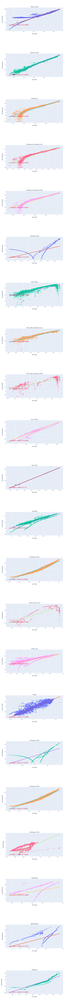

In [25]:
fig = make_subplots(rows=len(dfs), cols=1, start_cell='top-left', subplot_titles=[df['name'] for df in dfs])
for idx, _df in enumerate(dfs):
    name = _df['name']
    df = _df['df']

    # fit line
    parameters = fit_regression(df['log_stage'], df['log_discharge'])

    if 'pfolder' in _df:
        fopen = open(f'{BASE_DIR}/rating_curves/{_df["pfolder"]}/{name}_parameters.json', 'w+', encoding='utf-8')
    else:
        fopen = open(f'{BASE_DIR}/rating_curves/{name}/{name}_parameters.json', 'w+', encoding='utf-8')

    json.dump({'m': parameters['m'], 'c': parameters['c'], 'r_2': parameters['r_2']}, fopen,
              ensure_ascii=False, indent=4)
    fopen.close()
    
    text_label = f"y = {round(parameters['m'], 4)}x + {round(parameters['c'], 4)};\nr^2 = {round(parameters['r_2'], 4)}"
    _min = df.log_stage.min()
    _max = df.log_stage.max()
    x = np.linspace(_min, _max)
    
    # webgl for fast render
    fig.add_trace(go.Scattergl(x=df.log_stage,
                               y=df.log_discharge,
                               name=name,
                               mode='markers+text',
#                                text=[text_label],
#                                textposition=['top right'],
#                                textfont=dict(
#                                    family='sans serif',
#                                    size=18,
#                                    color='crimson'
#                                )
                              ),
                  row=idx+1, col=1)
    fig.add_trace(go.Scattergl(x=x,
                               y=parameters['m']*x + parameters['c'],
                               mode='lines+text',
                               line=dict(width=4),
                               text=[text_label],
                               textposition=['top right'],
                               textfont=dict(
                                   family='sans serif',
                                   size=18,
                                   color='crimson'
                               )),
                  row=idx+1, col=1)

    fig.update_xaxes(title_text='log stage', row=idx+1, col=1)
    fig.update_yaxes(title_text='log discharge', row=idx+1, col=1)

fig.update_layout(height=len(dfs)*600, width=1000, showlegend=False)
fig.show()